In [1]:
# important libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# 1A. Read the dataset
df = pd.read_csv('CHAMPS.csv')
df.head()

,packet_version_id,id_ver_nmb,champs_id,dp_001,dp_002,dp_003,dp_004,dp_005,dp_006,dp_007,...,dpf_012___ch00040,dpf_012___ch00041,dpf_012___ch00042,dpf_012___ch00043,dpf_012___ch01424,dpf_012___ch01875,dpf_012___ch00010,dpf_013,dpf_014,crf_060302_decode_panel_feedback_form_complete
0,ETAA00002_01_01,2.0.0,ETAA00002,5,1,2,3,4.0,5.0,6.0,...,0,0,0,0,0,0,0,Tseyon Tesfaye Clinical,NaN,2
1,ETAA00004_01_02,2.0.0,ETAA00004,5,1,2,3,4.0,5.0,6.0,...,0,0,0,0,0,0,0,"Adugna (SBS team), Tigistu (counselor), Tseyon...",NaN,2
2,ETAA00005_01_02,2.0.0,ETAA00005,5,1,2,3,4.0,5.0,6.0,...,0,0,0,0,0,0,0,"Adugna (SBS team), Tigistu (counselor), Tseyon...",NaN,2
3,ETAA00008_01_04,2.0.0,ETAA00008,5,1,2,3,4.0,5.0,6.0,...,0,0,0,0,0,0,0,"Abdurahman Yonis(HO), Eyoel Taye(counselor), G...",The family leaves in a refugee camp and even t...,2
4,ETAA00009_01_01,2.0.0,ETAA00009,5,18,19,20,21.0,7.0,NaN,...,0,0,0,0,0,0,0,NaN,NaN,0


In [3]:
# 1B. Determine the number of rows and columns in the dataset
rows, columns = df.shape
print(f'The dataset contains {rows} rows and {columns} columns.')

The dataset contains 444 rows and 381 columns.


In [4]:
# 1C. Enumetating columns
for index, column in enumerate(df.columns):
    print(f"Column {index}: {column}")

Column 0: packet_version_id
Column 1: id_ver_nmb
Column 2: champs_id
Column 3: dp_001
Column 4: dp_002
Column 5: dp_003
Column 6: dp_004
Column 7: dp_005
Column 8: dp_006
Column 9: dp_007
Column 10: dp_008
Column 11: dp_009
Column 12: dp_010
Column 13: dp_011
Column 14: dp_012
Column 15: dp_013
Column 16: dp_153
Column 17: dp_016
Column 18: dp_017
Column 19: dp_154
Column 20: dp_155
Column 21: dp_014
Column 22: dp_108
Column 23: dp_109
Column 24: dp_110
Column 25: dp_111
Column 26: dp_112
Column 27: dp_113
Column 28: dp_114
Column 29: dp_115
Column 30: dp_116
Column 31: dp_117
Column 32: dp_157
Column 33: dp_018
Column 34: dp_019
Column 35: dp_020
Column 36: dp_021
Column 37: dp_022
Column 38: dp_023
Column 39: dp_024
Column 40: dp_025
Column 41: dp_026
Column 42: dp_027
Column 43: dp_156
Column 44: dp_028
Column 45: dp_029
Column 46: dp_030
Column 47: dp_031
Column 48: dp_032
Column 49: dp_033
Column 50: dp_034
Column 51: dp_035
Column 52: dp_036
Column 53: dp_037
Column 54: dp_038
Co

In [5]:
# 1D. Rename the columns
df.rename(columns={'champs_id': 'CHAMPS_ID (Mortality)',
    'dp_013': 'case_type',
    'dp_108': 'underlying_cause',
    'dp_118': 'maternal_condition'
}, inplace=True)

In [6]:
# 1E. Rename values in the 'case_type' column
case_type_mapping = {
    'CH00716': 'Stillbirth',
    'CH01404': 'Death in the first 24 hours',
    'CH01405': 'Early Neonate (1 to 6 days)',
    'CH01406': 'Late Neonate (7 to 27 days)',
    'CH00718': 'Infant (28 days to less than 12 months)',
    'CH00719': 'Child (12 months to less than 60 months)'
}
df['case_type'].replace(case_type_mapping, inplace=True)

In [7]:
# 1F. Show the proportion of null values in each column
null_proportion = df.isnull().mean()
print('Proportion of null values in each column:')
print(null_proportion)

Proportion of null values in each column:
packet_version_id                                 0.000000
id_ver_nmb                                        0.000000
CHAMPS_ID (Mortality)                             0.000000
dp_001                                            0.000000
dp_002                                            0.000000
                                                    ...   
dpf_012___ch01875                                 0.000000
dpf_012___ch00010                                 0.000000
dpf_013                                           0.590090
dpf_014                                           0.603604
crf_060302_decode_panel_feedback_form_complete    0.000000
Length: 381, dtype: float64


In [8]:
# 2A. Magnitude and proportion of each infant underlying cause for child death
underlying_cause_counts = df['underlying_cause'].value_counts()
underlying_cause_proportions = df['underlying_cause'].value_counts(normalize=True)
print('Magnitude of each underlying cause for child death:')
print(underlying_cause_counts)
print('\nProportion of each underlying cause for child death:')
print(underlying_cause_proportions)

Magnitude of each underlying cause for child death:
underlying_cause
Intrauterine hypoxia                                148
Birth asphyxia                                       33
Undetermined                                         28
Severe acute malnutrition                            24
Craniorachischisis                                   16
                                                   ... 
Severe acute malnutrition-Kwashiorkor                 1
severe acute malnutrition, Marasmic Kwashiorkor       1
Severe acute malnutrition - Marasmic kwashiorkor      1
Congenital CMV infection                              1
Bacterial sepsis of the newborn                       1
Name: count, Length: 97, dtype: int64

Proportion of each underlying cause for child death:
underlying_cause
Intrauterine hypoxia                                0.333333
Birth asphyxia                                      0.074324
Undetermined                                        0.063063
Severe acute malnutriti

In [9]:
# 2B. Magnitude and proportion of maternal factors contributing to child death
maternal_condition_counts = df['maternal_condition'].value_counts()
maternal_condition_proportions = df['maternal_condition'].value_counts(normalize=True)
print('\nMagnitude of maternal factors contributing to child death:')
print(maternal_condition_counts)
print('\nProportion of maternal factors contributing to child death:')
print(maternal_condition_proportions)


Magnitude of maternal factors contributing to child death:
maternal_condition
Preeclampsia                                                                                             36
Twin pregnancy                                                                                           12
Fetus and newborn affected by other forms of placental separation and hemorrhage (Abruption placenta)    11
Eclampsia                                                                                                 9
Fetus and newborn affected by other forms of placental separation and hemorrhage                          5
                                                                                                         ..
Fetus and newborn affected by oligohydramnios                                                             1
Fetus and newborn affected by maternal diabetes                                                           1
Fetus and newborn affected by maternal infectious and par

In [10]:
# 2C. Proportion of child deaths by case type
case_type_counts = df['case_type'].value_counts()
case_type_proportions = df['case_type'].value_counts(normalize=True)
print('\nMagnitude of child deaths by case type:')
print(case_type_counts)
print('\nProportion of child deaths by case type:')
print(case_type_proportions)


Magnitude of child deaths by case type:
case_type
Stillbirth                                  239
Death in the first 24 hours                  69
Early Neonate (1 to 6 days)                  49
Child (12 months to less than 60 months)     42
Infant (28 days to less than 12 months)      27
Late Neonate (7 to 27 days)                  18
Name: count, dtype: int64

Proportion of child deaths by case type:
case_type
Stillbirth                                  0.538288
Death in the first 24 hours                 0.155405
Early Neonate (1 to 6 days)                 0.110360
Child (12 months to less than 60 months)    0.094595
Infant (28 days to less than 12 months)     0.060811
Late Neonate (7 to 27 days)                 0.040541
Name: proportion, dtype: float64


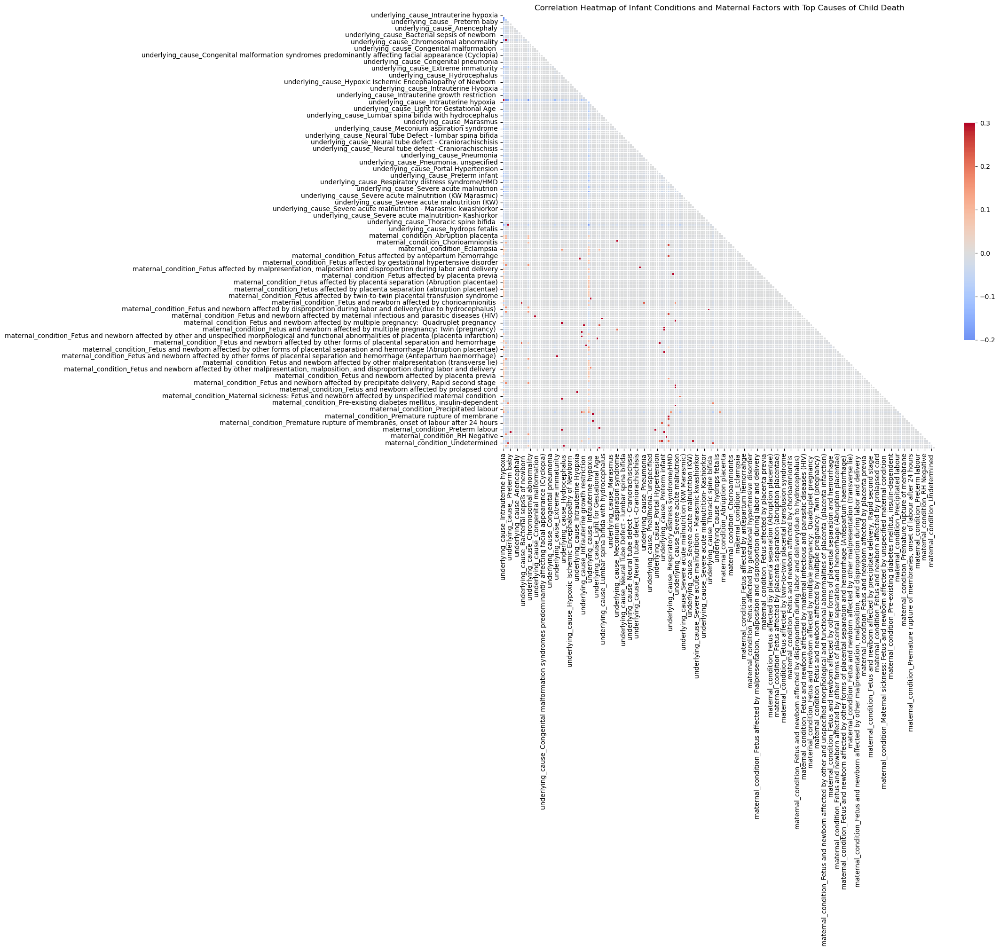

In [11]:
# 3. Correlation analysis

df_subset=df.loc[:,['underlying_cause','maternal_condition']]
# The top three causes of child death from 2A
top_three_causes = ['underlying_cause_Intrauterine hypoxia', 'underlying_cause_Birth asphyxia', 'underlying_cause_Undetermined']  # Replace with actual causes

# Create dummy variables for categorical columns
df_dummies = pd.get_dummies(df_subset, columns=['underlying_cause', 'maternal_condition'], drop_first=True)

# Select the relevant columns for correlation analysis
correlation_columns = top_three_causes + [col for col in df_dummies.columns if 'underlying_cause' in col or 'maternal_condition' in col]
df_corr = df_dummies[correlation_columns]

# Calculate the correlation matrix
correlation_matrix = df_corr.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Add title and labels
plt.title('Correlation Heatmap of Infant Conditions and Maternal Factors with Top Causes of Child Death')
plt.show()

In [12]:
# 4. Feature engineering

# Define feature matrix X and target vector y for each cause
X = df_dummies.drop(columns=top_three_causes)
y_dict = {cause: df_dummies[cause] for cause in top_three_causes}

In [13]:
# Important libraries

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

# List of models to use
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'SVM': SVC(kernel='linear', probability=True),
    'AdaBoost': AdaBoostClassifier(),
    'RandomForest': RandomForestClassifier(),
    'GradientBoosting': GradientBoostingClassifier(),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Dictionary to store feature importances
feature_importances = {cause: {model_name: [] for model_name in models.keys()} for cause in top_three_causes}

# Train each model and gather feature importances
for cause, y in y_dict.items():
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Standardize features for models that benefit from it
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    for model_name, model in models.items():
        if model_name in ['LogisticRegression', 'SVM']:
            model.fit(X_train_scaled, y_train)
        else:
            model.fit(X_train, y_train)
        
        # Calculate accuracy
        y_pred = model.predict(X_test_scaled if model_name in ['LogisticRegression', 'SVM'] else X_test)
        accuracy = accuracy_score(y_test, y_pred)
        print(f'{model_name} accuracy for {cause}: {accuracy}')
        
        # Retrieve feature importances
        if hasattr(model, 'coef_'):
            importance = np.abs(model.coef_[0])
        elif hasattr(model, 'feature_importances_'):
            importance = model.feature_importances_
        else:
            importance = np.zeros(len(X.columns))  # In case the model doesn't support feature importances
        
        feature_importances[cause][model_name] = importance

LogisticRegression accuracy for underlying_cause_Intrauterine hypoxia: 0.7089552238805971
SVM accuracy for underlying_cause_Intrauterine hypoxia: 0.6865671641791045
AdaBoost accuracy for underlying_cause_Intrauterine hypoxia: 0.7238805970149254
RandomForest accuracy for underlying_cause_Intrauterine hypoxia: 0.7388059701492538
GradientBoosting accuracy for underlying_cause_Intrauterine hypoxia: 0.7388059701492538
XGBoost accuracy for underlying_cause_Intrauterine hypoxia: 0.7089552238805971
LogisticRegression accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
SVM accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
AdaBoost accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
RandomForest accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
GradientBoosting accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
XGBoost accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
LogisticRegression accuracy for underlying_c

In [14]:
# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame(index=X.columns)

for cause in top_three_causes:
    for model_name in models.keys():
        feature_importance_df[f'{cause}_{model_name}'] = feature_importances[cause][model_name]

# Ranking features based on average importance across all models for each cause
for cause in top_three_causes:
    feature_importance_df[f'{cause}_avg_importance'] = feature_importance_df[f'{cause}_{model_name}'].mean()

In [15]:
# important libraries 
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Additional imports for ensemble models
from sklearn.ensemble import VotingClassifier

In [16]:
# Define StratifiedKFold for cross-validation
n_folds = 5
skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)

# Dictionary to store cross-validation results
cv_results = {model_name: {cause: [] for cause in top_three_causes} for model_name in models.keys()}

for cause, y in y_dict.items():
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    X_train_scaled = scaler.fit_transform(X_train)
    
    for model_name, model in models.items():
        if model_name in ['LogisticRegression', 'SVM']:
            cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=skf, scoring='accuracy')
        else:
            cv_scores = cross_val_score(model, X_train, y_train, cv=skf, scoring='accuracy')
        
        cv_results[model_name][cause] = cv_scores
        print(f'{model_name} {cause} CV Accuracy: {np.mean(cv_scores)} ± {np.std(cv_scores)}')

# Select the best performing model based on cross-validation results
best_models = {}
for cause in top_three_causes:
    best_model_name = max(cv_results, key=lambda model_name: np.mean(cv_results[model_name][cause]))
    best_models[cause] = models[best_model_name]
    print(f'Best model for {cause}: {best_model_name}')

LogisticRegression underlying_cause_Intrauterine hypoxia CV Accuracy: 0.6903225806451612 ± 0.021397579292615508
SVM underlying_cause_Intrauterine hypoxia CV Accuracy: 0.6548387096774194 ± 0.05642856672430936
AdaBoost underlying_cause_Intrauterine hypoxia CV Accuracy: 0.7032258064516128 ± 0.031606319261718425
RandomForest underlying_cause_Intrauterine hypoxia CV Accuracy: 0.6548387096774194 ± 0.02187848381653314
GradientBoosting underlying_cause_Intrauterine hypoxia CV Accuracy: 0.6806451612903226 ± 0.02370473944628885
XGBoost underlying_cause_Intrauterine hypoxia CV Accuracy: 0.6967741935483872 ± 0.05806451612903225
LogisticRegression underlying_cause_Birth asphyxia CV Accuracy: 0.896774193548387 ± 0.016448450043847682
SVM underlying_cause_Birth asphyxia CV Accuracy: 0.896774193548387 ± 0.016448450043847682
AdaBoost underlying_cause_Birth asphyxia CV Accuracy: 0.8935483870967742 ± 0.016448450043847682
RandomForest underlying_cause_Birth asphyxia CV Accuracy: 0.896774193548387 ± 0.01644

In [17]:
# Create VotingClassifier (ensemble) for each cause
ensembles = {}
for cause in top_three_causes:
    ensemble = VotingClassifier(estimators=[(name, model) for name, model in models.items()], voting='soft')
    ensembles[cause] = ensemble
    ensemble.fit(X_train, y_train)
    y_pred = ensemble.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Ensemble model accuracy for {cause}: {accuracy}')

Ensemble model accuracy for underlying_cause_Intrauterine hypoxia: 0.9402985074626866
Ensemble model accuracy for underlying_cause_Birth asphyxia: 0.9402985074626866
Ensemble model accuracy for underlying_cause_Undetermined: 0.9402985074626866


In [18]:
# Evaluate the best model and ensemble model using accuracy
for cause in top_three_causes:
    X_train, X_test, y_train, y_test = train_test_split(X, y_dict[cause], test_size=0.3, random_state=42)
    X_train_scaled = scaler.fit_transform(X_train)
    
    best_model = best_models[cause]
    best_model.fit(X_train_scaled, y_train)
    y_pred = best_model.predict(scaler.transform(X_test))
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Best model ({type(best_model).__name__}) accuracy for {cause}: {accuracy}')
    
    ensemble = ensembles[cause]
    ensemble.fit(X_train_scaled, y_train)
    y_pred = ensemble.predict(scaler.transform(X_test))
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Ensemble model accuracy for {cause}: {accuracy}')

Best model (AdaBoostClassifier) accuracy for underlying_cause_Intrauterine hypoxia: 0.7388059701492538
Ensemble model accuracy for underlying_cause_Intrauterine hypoxia: 0.753731343283582
Best model (XGBClassifier) accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
Ensemble model accuracy for underlying_cause_Birth asphyxia: 0.9552238805970149
Best model (LogisticRegression) accuracy for underlying_cause_Undetermined: 0.9477611940298507
Ensemble model accuracy for underlying_cause_Undetermined: 0.9477611940298507


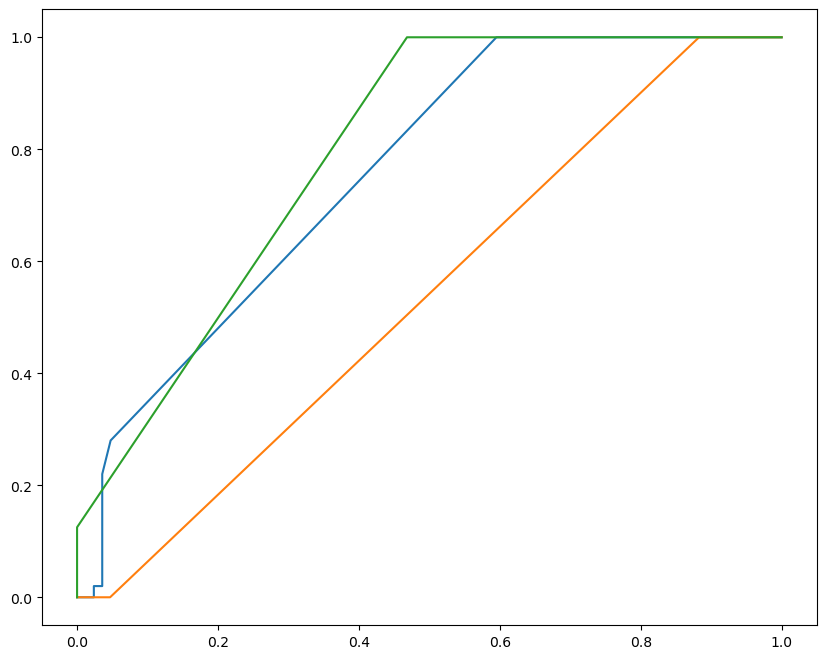

In [19]:
# Plot ROC curves for best models and ensembles
plt.figure(figsize=(10, 8))

for cause in top_three_causes:
    X_train, X_test, y_train, y_test = train_test_split(X, y_dict[cause], test_size=0.3, random_state=42)
    X_train_scaled = scaler.fit_transform(X_train)
    
    best_model = best_models[cause]
    best_model.fit(X_train_scaled, y_train)
    y_probs = best_model.predict_proba(scaler.transform(X_test))[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    auc = roc_auc_score(y_test, y_probs)
    plt.plot(fpr, tpr, label=f'Best Model ({type(best_model).__name__}) for {cause} (AUC = {auc:.2f})')
    
    ensemble = ensembles[cause]
    ensemble.fit(X_train_scaled, y_train)
    y_probs = ensemble.predict

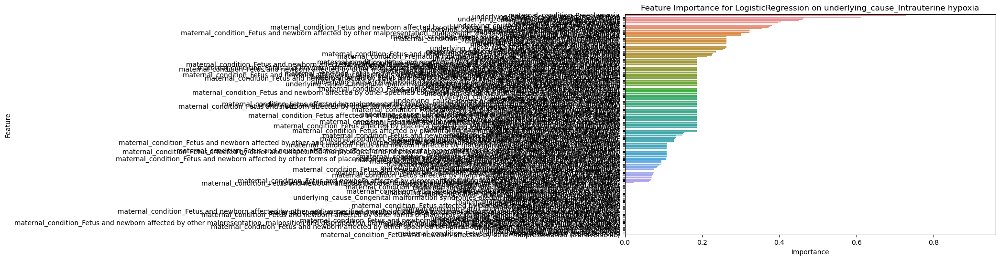

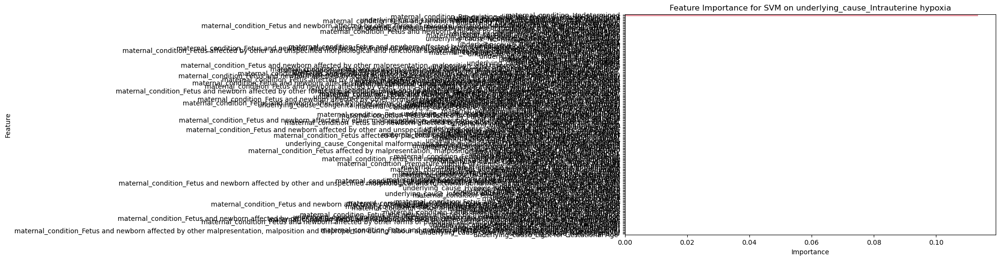

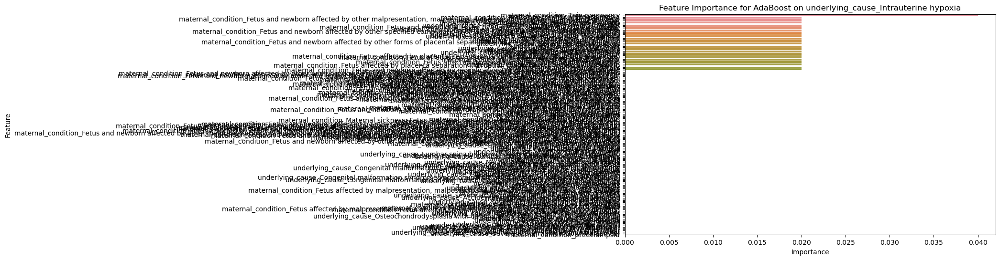

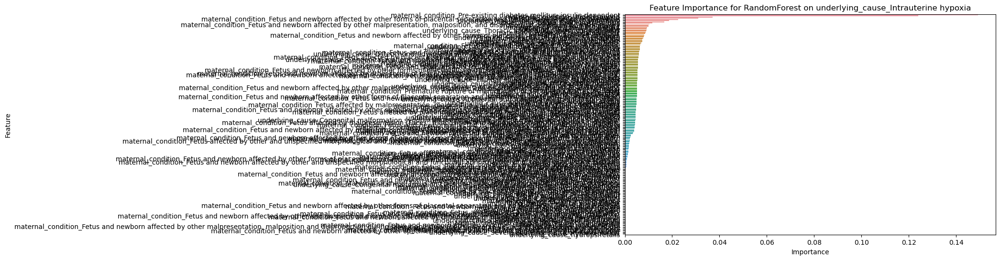

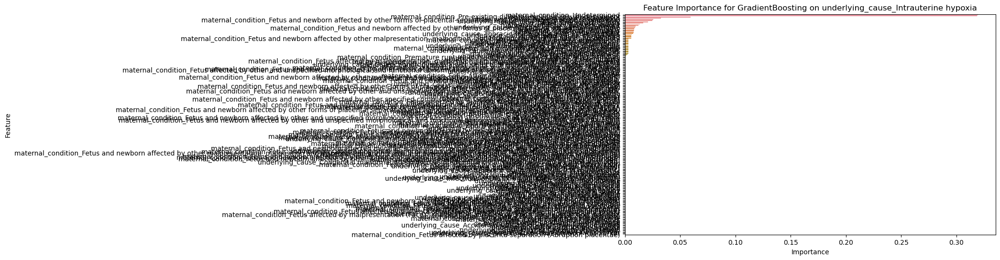

...

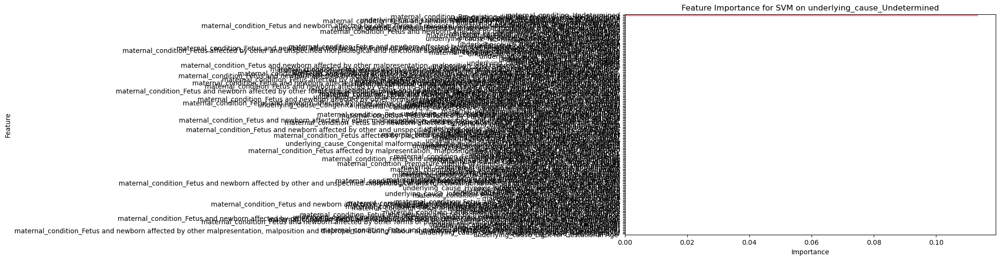

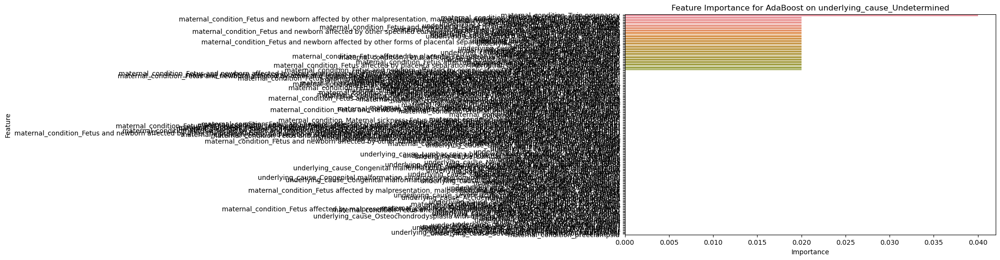

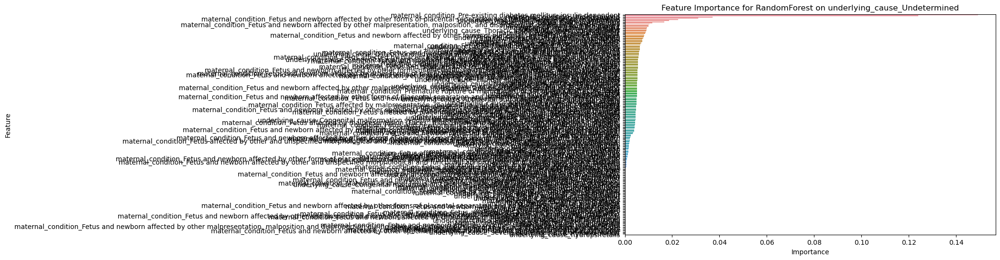

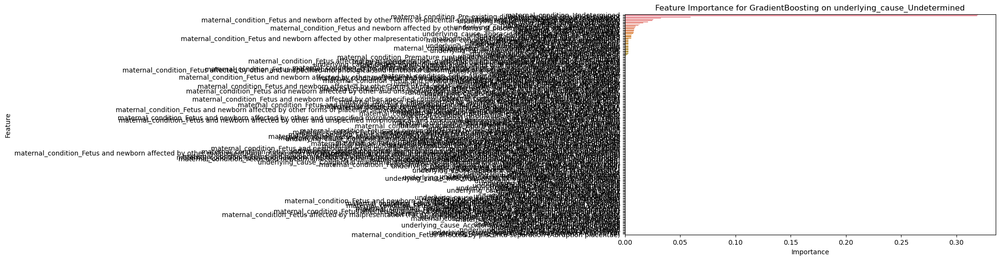

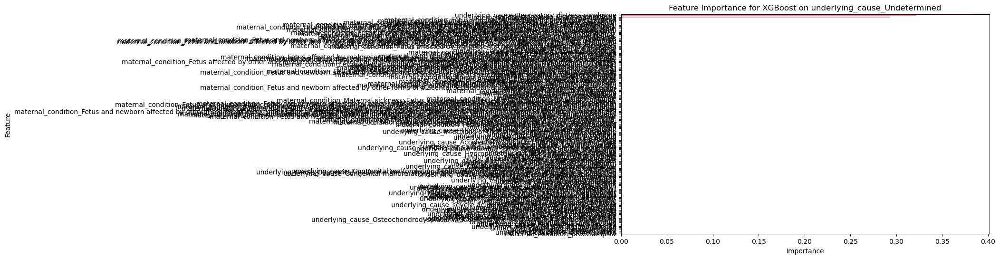

In [20]:
# Plot feature importance for each model and cause
for cause in top_three_causes:
    for model_name, model in models.items():
        if hasattr(model, 'coef_'):
            importance = np.abs(model.coef_[0])
        elif hasattr(model, 'feature_importances_'):
            importance = model.feature_importances_
        else:
            continue
        
        feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title(f'Feature Importance for {model_name} on {cause}')
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.show()

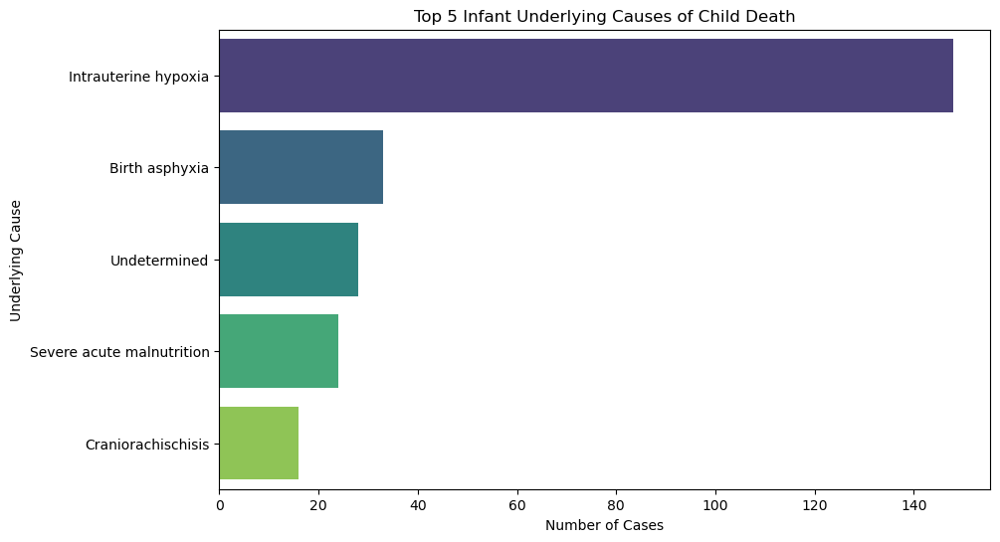

In [21]:
# Assuming 'underlying_cause' column in the original dataframe
top_underlying_causes = df['underlying_cause'].value_counts().head(5)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_underlying_causes.values, y=top_underlying_causes.index, palette='viridis')
plt.title('Top 5 Infant Underlying Causes of Child Death')
plt.xlabel('Number of Cases')
plt.ylabel('Underlying Cause')
plt.show()

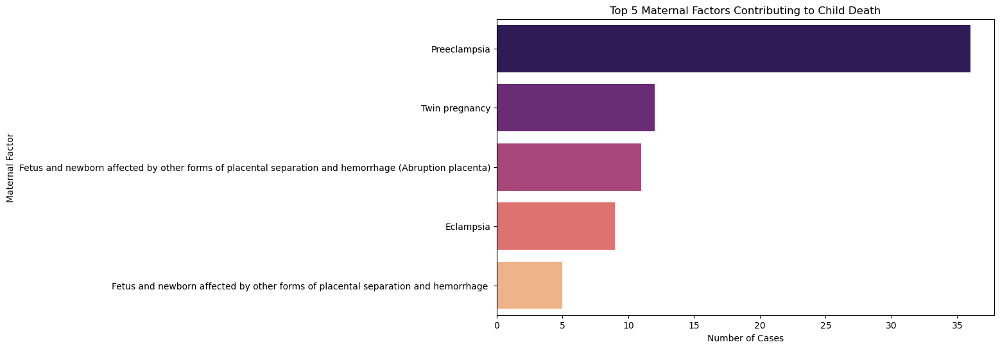

In [22]:
# Assuming 'maternal_condition' column in the original dataframe
top_maternal_factors = df['maternal_condition'].value_counts().head(5)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_maternal_factors.values, y=top_maternal_factors.index, palette='magma')
plt.title('Top 5 Maternal Factors Contributing to Child Death')
plt.xlabel('Number of Cases')
plt.ylabel('Maternal Factor')
plt.show()

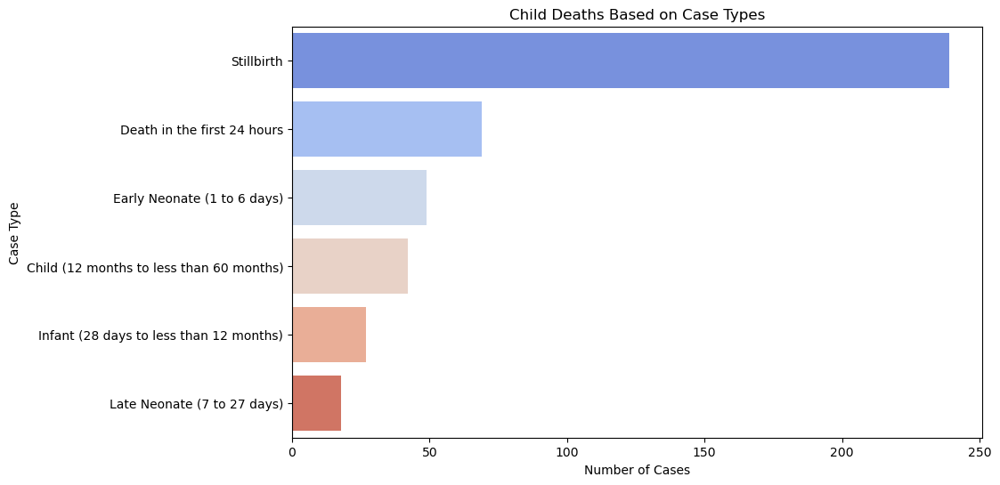

In [23]:
# Assuming 'case_type' column in the original dataframe
case_type_counts = df['case_type'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=case_type_counts.values, y=case_type_counts.index, palette='coolwarm')
plt.title('Child Deaths Based on Case Types')
plt.xlabel('Number of Cases')
plt.ylabel('Case Type')
plt.show()